### Step3: select a subregion 

In [4]:
import timeit
import pickle
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

In [5]:
# transparent background
plt.rcParams.update({
    "figure.facecolor":  (0.0, 0.0, 0.0, 0.0),  
    "axes.facecolor":    (0.0, 0.0, 0.0, 0.0),  
})

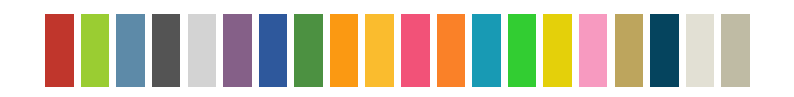

In [6]:
# define colors
purple = '#856088'
pink = '#F25278'
red = '#c0362c'
lightgreen = '#93c572'
darkgreen = '#4c9141'
lightblue = '#5d8aa8'
darkblue = '#2e589c'
white = '#fafafa'
lightgray = '#d3d3d3'
darkgray ='#545454'
lightorange = '#fabc2e'
darkorange = '#fb9912'
lightyellow = '#e4d00a'
lightgreen2 = '#32CD32'
lightgreen = '#9ACD32'
lightblue2 = '#189AB4'
darkblue2 = '#05445E'
lightpink = '#F79AC0'
darkorange2 = '#FA8128'
darkyellow = '#BDA55D'
lightgray2 = '#E2E0D4'
lightgray3 = '#BFBBA4'

# see how the colors look together
colors = [
    red, lightgreen, lightblue, darkgray, lightgray,
    purple, darkblue, darkgreen, darkorange, lightorange,
    pink, darkorange2, lightblue2, lightgreen2, lightyellow,
    lightpink, darkyellow, darkblue2, lightgray2, lightgray3
]

plt.figure(figsize=(10, 1))
plt.bar(range(len(colors)), height=1, color=colors)
__ = plt.axis('off')

#### load data

In [7]:
# annotated data
path = '../output_step2/typed_new_merfish_data_dict.pkl'
data = pd.read_pickle(path)
cell_mask_df = data['cell_mask_df']
df = data['data_df']
centroid_df_com = data['centroid_df_com']
del data

In [8]:
# raw expr data
experiment_name = '220501_wb3_co2_15_5z18R_merfish5'
path = '../processed_data/decoded_spots/mouse2_coronal/spots_'+experiment_name+'.csv'
expr_df = pd.read_csv(path)

#### select a subregion

In [9]:
marker_EX = ['Rprm', 'Myl4', 'Rorb', 'Cux2', 'Lamp5', 'Slc17a7']
marker_IN = ['Reln', 'Pvalb', 'Gad2']
marker_Astr = ['Sox9', 'Aqp4', 'Gfap', 'Mfge8', 'Agt']
marker_Oligo = ['Sox10']

In [10]:
# manually selected region
x1 = 500
x2 = 2500
y1 = 500
y2 = 2500

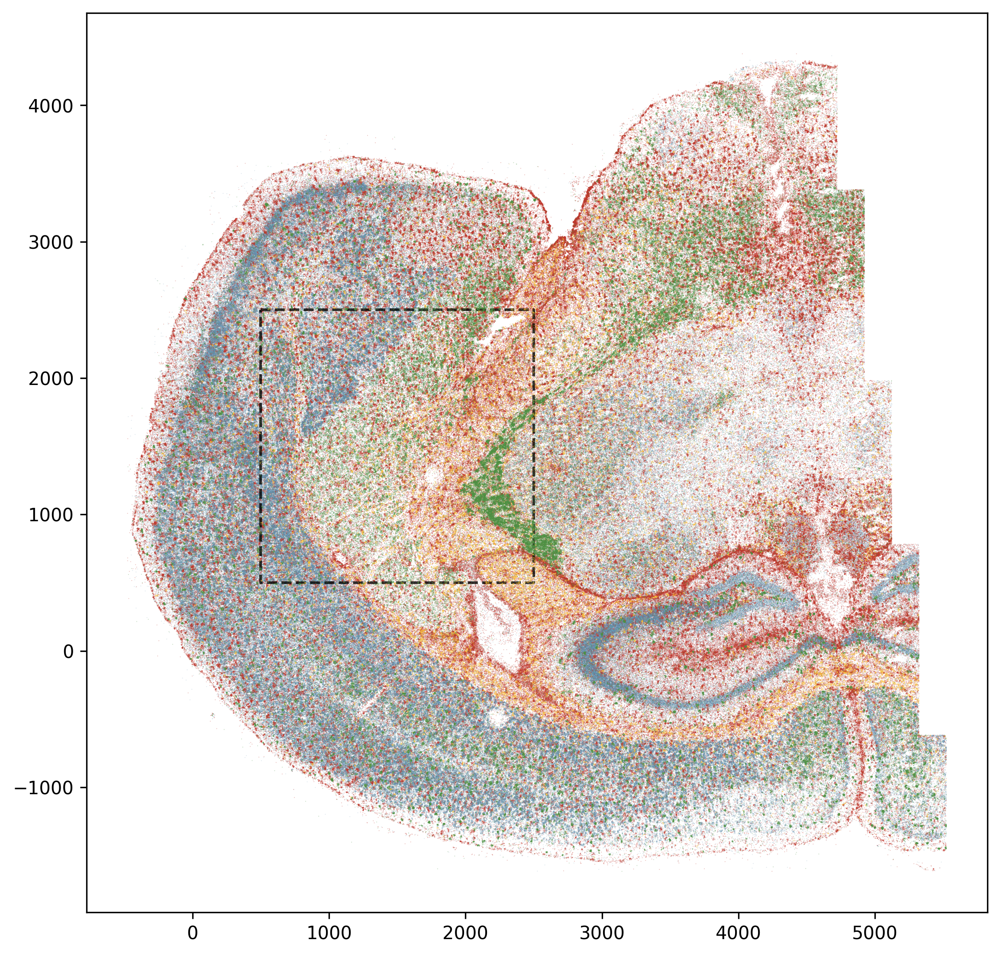

In [13]:
# plot marker genes -- half brain
df_plot = expr_df[(expr_df.global_x>-2000)&(expr_df.global_x>-2000)]

nr = 1
nc = 1
ss_nr = 9
ss_nc = 9
fig = plt.figure(figsize=(nc*ss_nc, nr*ss_nr), dpi=300)
gs = fig.add_gridspec(nr,nc,
                      width_ratios=[1]*nc,
                      height_ratios=[1]*nr)
gs.update(wspace=0.0, hspace=0.0)
ax = plt.subplot(gs[0, 0])

gl = marker_EX
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=lightblue,
           zorder=1,
           alpha=0.2)
gl = marker_IN
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=darkgreen,
           zorder=4,
           alpha=0.3)
gl = marker_Astr
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=red,
           zorder=2,
           alpha=0.3)
gl = marker_Oligo
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=lightorange,
           zorder=3,
           alpha=0.3)

ax.plot([x1, x2, x2, x1, x1],
        [y2, y2, y1, y1, y2],
        lw=1.5,
        linestyle='dashed',
        alpha=0.8,
        color='black')

ax.set_aspect('equal', adjustable='box')

# ax.axis('off')
plt.savefig(f'figs/expr_half.png', dpi=300, bbox_inches='tight')

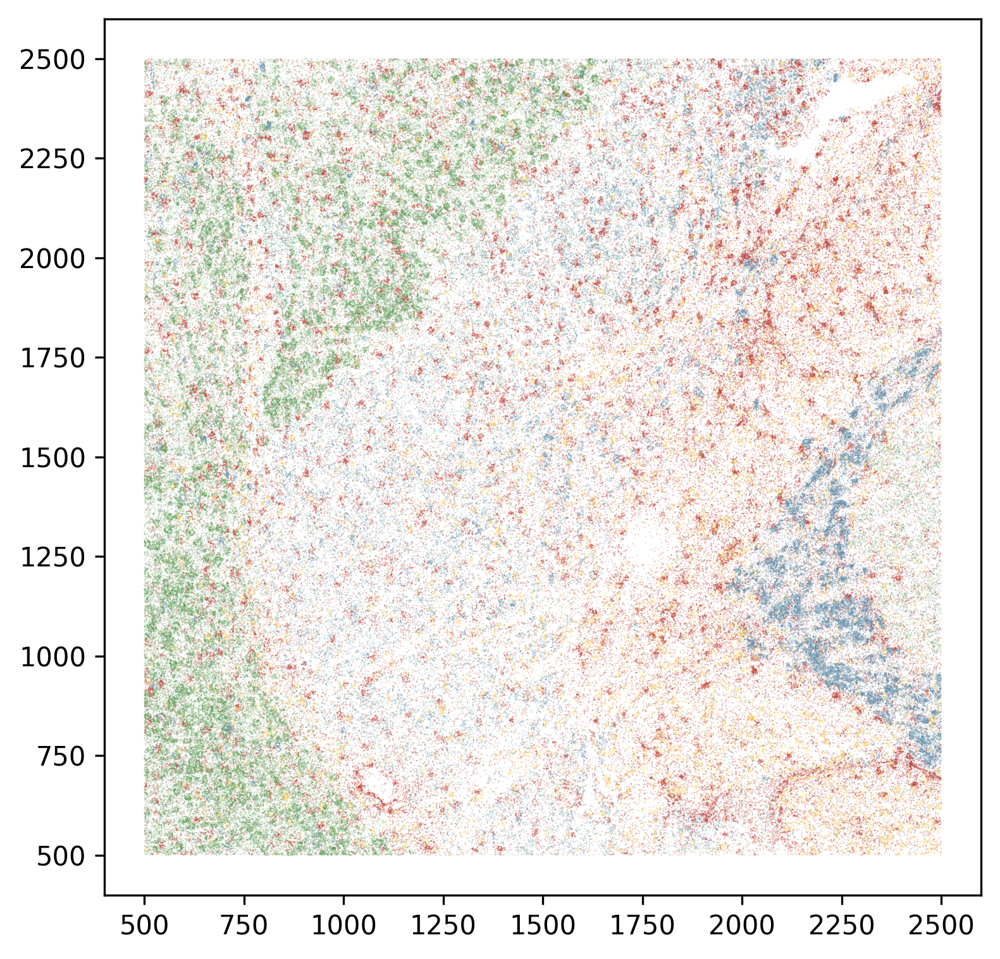

In [12]:
# plot marker genes -- subregion
df_plot = expr_df[(expr_df.global_x>x1)&(expr_df.global_x<x2)&(expr_df.global_y>y1)&(expr_df.global_y<y2)]

nr = 1
nc = 1
ss_nr = 6
ss_nc = 6
fig = plt.figure(figsize=(nc*ss_nc, nr*ss_nr), dpi=300)
gs = fig.add_gridspec(nr,nc,
                      width_ratios=[1]*nc,
                      height_ratios=[1]*nr)
gs.update(wspace=0.0, hspace=0.0)
ax = plt.subplot(gs[0, 0])

gl = marker_EX
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=darkgreen,
           zorder=1,
           alpha=0.2)
gl = marker_IN
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=lightblue,
           zorder=4,
           alpha=0.3)
gl = marker_Astr
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=red,
           zorder=2,
           alpha=0.3)
gl = marker_Oligo
df_gl = df_plot[df_plot.target_gene.isin(gl)]
ax.scatter(df_gl.global_x, df_gl.global_y,
           marker='.',
           edgecolor='none',
           s=1,
           color=lightorange,
           zorder=3,
           alpha=0.3)

ax.set_aspect('equal', adjustable='box')

# ax.axis('off')
# plt.savefig(f'figs/region.png', dpi=300, bbox_inches='tight')

In [105]:
df_sub = df[(df.x>x1)&(df.x<x2)&(df.y>y1)&(df.y<y2)]
df_sub.groupby('cell').first()['type'].value_counts()

Oligo    1335
less     1272
EX        803
IN        745
Astr      719
else      368
Name: type, dtype: int64

In [106]:
type_list = ['EX', 'IN', 'Astr', 'Oligo']
df_typed = df_sub[df_sub.type.isin(type_list)]

In [107]:
cell_list = df_typed.cell.unique()

#### QC-KLD

In [108]:
# seg with KLD at any z > this will be excluded
# chose this bc step1 under section "explore KL divergense of two segs" 
# the cells in the plot
KLD_thre = 0.5 #!!!<<<

#!!!<<< number of x/y bins
# 5 seems good
D = 5 

In [109]:
c0 = 1e-8
cell_list_KLD = []

start = timeit.default_timer()

Z = 5 # num of z panels
for ic, c in enumerate(cell_list[:]):
    if ic%5e3 == 0:
        print(np.round(ic/len(cell_list),1))
        
    seg_df_c = cell_mask_df[cell_mask_df['Unnamed: 0']==c]
    
    # all bc x/y vals
    cb_x_allz = np.empty([0])
    cb_y_allz = np.empty([0])
    for z in range(Z):
        cb_x_str = seg_df_c['boundaryX_z'+str(z)].iloc[0]
        cb_y_str = seg_df_c['boundaryY_z'+str(z)].iloc[0]
        cb_x = np.fromstring(cb_x_str, sep=',')
        cb_y = np.fromstring(cb_y_str, sep=',')
        cb_x_allz = np.concatenate((cb_x_allz, cb_x))
        cb_y_allz = np.concatenate((cb_y_allz, cb_y))
    xmin_ = cb_x_allz.min() - c0
    xmax_ = cb_x_allz.max() + c0
    ymin_ = cb_y_allz.min() - c0
    ymax_ = cb_y_allz.max() + c0

    delta_x = (xmax_-xmin_)/D
    delta_y = (ymax_-ymin_)/D
    
    # label of each bin
    prob_x = {}
    prob_y = {}
    for z in range(Z):
        cb_x_str = seg_df_c['boundaryX_z'+str(z)].iloc[0]
        cb_y_str = seg_df_c['boundaryY_z'+str(z)].iloc[0]
        cb_x = np.fromstring(cb_x_str, sep=',')
        cb_y = np.fromstring(cb_y_str, sep=',')
        lab_x = (cb_x-xmin_)//delta_x
        lab_y = (cb_y-ymin_)//delta_y
        count_x = np.zeros(D)
        count_y = np.zeros(D)
        arr_x = np.array(list(Counter(lab_x).items())).astype(int)
        arr_y = np.array(list(Counter(lab_y).items())).astype(int)
        count_x[arr_x[:,0]] = arr_x[:,1]
        count_y[arr_y[:,0]] = arr_y[:,1]
        prob_x[z] = count_x/np.sum(count_x)
        prob_y[z] = count_y/np.sum(count_y)
        
        
    # KL-d between z0 and others
    kld_x = np.zeros(Z)
    kld_y = np.zeros(Z)
    for z in range(Z):
        kld_x[z] = np.sum(prob_x[z]*np.log((prob_x[z]+c0)/(prob_x[0]+c0) + c0))
        kld_y[z] = np.sum(prob_y[z]*np.log((prob_y[z]+c0)/(prob_y[0]+c0) + c0))
        
    if kld_x.max()<KLD_thre and kld_y.max()<KLD_thre:
        cell_list_KLD.append(c)
        
stop = timeit.default_timer()
print(f'Time: {stop - start}') 

print(len(cell_list))
print(len(cell_list_KLD))

# Time: 330.6325426986441
# 36939
# 32439

0.0
Time: 23.838278893381357
3602
3190


#### QC center

In [110]:
# remove cells with center too close to cell boundary
# keep cells if dmin/dmax > DR_thre
DR_thre = 0.5

In [111]:
cell_list_KLD_DR = []
z = 0 # only look at z=0 panel

start = timeit.default_timer()

for ic, c in enumerate(cell_list_KLD[:]):
    if ic%1e3 == 0:
        print(np.round(ic/len(cell_list_KLD), 1))
        
    seg_df_c = cell_mask_df[cell_mask_df['Unnamed: 0']==c]
    
    # all bc at z=0
    cb_x_str = seg_df_c['boundaryX_z'+str(z)].iloc[0]
    cb_y_str = seg_df_c['boundaryY_z'+str(z)].iloc[0]
    cb_x = np.fromstring(cb_x_str, sep=',')
    cb_y = np.fromstring(cb_y_str, sep=',')
    
    # center (for computing speed)
    cx = centroid_df_com[centroid_df_com.index==c].center_x.iloc[0]
    cy = centroid_df_com[centroid_df_com.index==c].center_y.iloc[0]

    # cb dist to center
    d = ((cb_x - cx)**2 + (cb_y - cy)**2)**(1/2)
    r = d.min()/d.max()
    
    # keep cells with ratio > DR_thre
    if r > DR_thre:
        cell_list_KLD_DR.append(c)
        
stop = timeit.default_timer()
print(f'Time: {stop - start}') 

print(len(cell_list_KLD))
print(len(cell_list_KLD_DR))

0.0
0.3
0.6
0.9
Time: 30.697553171776235
3190
2530


In [112]:
df_QC = df[df.cell.isin(cell_list_KLD_DR)]

#### gene/cell list

In [113]:
df_QC['umi'] = 1

/tmp/ipykernel_2853070/4061589703.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_QC['umi'] = 1


In [114]:
print(np.sum(df_QC.cell=='0'))
print(np.sum(np.isnan(df_QC.centerX)))
print(df_QC.type.unique())

0
0
['Astr' 'Oligo' 'EX' 'IN']


In [132]:
data_df = df_QC

In [133]:
# filtering params
# 1. min #cells available for a gene
nc_avl_min = 20
# 2. >=`nc_expr_thre` number of cells with gene counts>=`expr_thre`
expr_thre = 1
nc_expr_thre = 1
# 3. sort the genes and get the dataframe

In [134]:
# 1. nc_avl_min
gene_list_dict1 = {}
df_dict1 = {}
for t in type_list:
    df_t = data_df[data_df.type==t]
    nc_avl_t = df_t.groupby('gene')['cell'].nunique()
    nc_avl_t_filtered = nc_avl_t[nc_avl_t>=nc_avl_min]
    gene_list_dict1[t] = nc_avl_t_filtered.index.to_numpy()
    df_dict1[t] = df_t[df_t.gene.isin(gene_list_dict1[t])]
    print(f'type {t} #genes={len(gene_list_dict1[t])}')

type EX #genes=878
type IN #genes=856
type Astr #genes=557
type Oligo #genes=705


In [135]:
# 2. nc_expr_thre and expr_thre
gene_list_dict2 = {}
for t in type_list:
    df_t = df_dict1[t]
    df_t_gbG = df_t.groupby('gene')
    gl_t = []
    for g in gene_list_dict1[t][:]:
        df_t_g = df_t_gbG.get_group(g)
        sc_umi_g = df_t_g.groupby('cell')['umi'].sum()
        if np.sum(sc_umi_g>=expr_thre)>=nc_expr_thre:
            gl_t.append(g)
    gene_list_dict2[t] = np.array(gl_t)
    print(f'type {t} #genes={len(gl_t)}')

type EX #genes=878
type IN #genes=856
type Astr #genes=557
type Oligo #genes=705


In [136]:
# 3. get the df and sort the genes
gene_list_dict3 = {}
cell_list_dict3 = {}
df_dict3 = {}
for t in type_list:
    gl_t2 = gene_list_dict2[t]
    df_t = data_df[data_df.type==t]
    df_t3 = df_t[df_t.gene.isin(gl_t2)]
    gl_t3 = df_t3.groupby('gene')['umi'].sum().sort_values(ascending=False).index.to_numpy()
    gene_list_dict3[t] = gl_t3
    df_dict3[t] = df_t3
    cell_list_dict3[t] = df_t3.cell.unique().tolist()

In [137]:
data_df = pd.concat(list(df_dict3.values()))
gene_list_dict = gene_list_dict3
cell_list_dict = cell_list_dict3
cell_list_all = [item for sublist in list(cell_list_dict.values()) for item in sublist]

In [138]:
print(f'total #cells {len(cell_list_all)}')
for t in type_list:
    print(f'{t} #genes {len(gene_list_dict[t])} #cells {len(cell_list_dict[t])}')

total #cells 2530
EX #genes 878 #cells 577
IN #genes 856 #cells 525
Astr #genes 557 #cells 480
Oligo #genes 705 #cells 948


In [139]:
data_df.head()

,barcode_id,x,y,z,_x,_y,fov,gene,cell,centerX,centerY,sc_total,type,umi
31328227,61,489.51166,740.64210,0.0,1631.3914,1561.9457,634,Satb2,100314503909850594920131237029479567274,494.755498,744.35401,657,EX,1
31328231,61,488.42830,744.41907,0.0,1621.4524,1596.5967,634,Satb2,100314503909850594920131237029479567274,494.755498,744.35401,657,EX,1
31328860,77,494.39008,738.88007,0.0,1676.1476,1545.7806,634,Slc17a7,100314503909850594920131237029479567274,494.755498,744.35401,657,EX,1
31328864,77,492.46686,739.41974,0.0,1658.5034,1550.7314,634,Slc17a7,100314503909850594920131237029479567274,494.755498,744.35401,657,EX,1
31328865,77,489.30914,739.98420,0.0,1629.5334,1555.9099,634,Slc17a7,100314503909850594920131237029479567274,494.755498,744.35401,657,EX,1


#### prepare cell masks/boundaries

In [140]:
cell_mask_df.head(2)

,Unnamed: 0,boundaryX_z0,boundaryY_z0,boundaryX_z1,boundaryY_z1,boundaryX_z2,boundaryY_z2,boundaryX_z3,boundaryY_z3,boundaryX_z4,boundaryY_z4
0,4195605887788691952135636853561851,"3250.893838056922, 3250.893838056922, 3250.893...","2744.462888389826, 2744.3538883924484, 2744.24...","3247.6238381356, 3247.6238381356, 3247.6238381...","2747.4058883190155, 2747.296888321638, 2747.18...","3246.8608381539584, 3246.8608381539584, 3246.8...","2747.7328883111477, 2747.6238883137703, 2747.5...","3246.8608381539584, 3246.8608381539584, 3246.8...","2747.4058883190155, 2747.296888321638, 2747.18...","3250.56683806479, 3250.56683806479, 3250.56683...","2743.0458884239197, 2742.9368884265423, 2742.8..."
1,5780261735764654093526972708487477,"-7246.938868483901, -7246.938868483901, -7246....","-1168.5700405836105, -1168.679040580988, -1168...","-7247.592868468166, -7247.592868468166, -7247....","-1172.6030404865742, -1172.7120404839516, -117...","-7249.772868415714, -7249.772868415714, -7249....","-1166.3900406360626, -1166.49904063344, -1166....","-7249.4458684235815, -7249.4458684235815, -724...","-1166.3900406360626, -1166.49904063344, -1166....","-7249.118868431449, -7249.118868431449, -7249....","-1166.0630406439304, -1166.1720406413078, -116..."


In [141]:
start = timeit.default_timer()

Z = 5
cb_dict = {}

for ic, c in enumerate(cell_list_all):
    seg_c = cell_mask_df[cell_mask_df['Unnamed: 0']==c]
    for z in range(Z):
        cb_z_c_x = seg_c['boundaryX_z'+str(z)].iloc[0]
        cb_z_c_y = seg_c['boundaryY_z'+str(z)].iloc[0]
        cb_x = np.fromstring(cb_z_c_x, sep=',')
        cb_y = np.fromstring(cb_z_c_y, sep=',')
        cb_df_c = pd.DataFrame({'x': cb_x, 'y': cb_y})
        cb_df_c['cell'] = c
        cb_df_c['z'] = z
        cb_dict[f'{c}_z{z}'] = cb_df_c

stop = timeit.default_timer()
print('Time: ', stop - start)

# concatenate all cell_masks_dict to one df
cb_df = pd.concat(list(cb_dict.values()))

Time:  17.979716889560223


In [142]:
print(cb_df.cell.nunique())
print(len(cell_list_all))

2530
2530


In [143]:
cb_df.head(2)

,x,y,cell,z
0,502.559898,746.31601,100314503909850594920131237029479567274,0
1,502.559898,746.20701,100314503909850594920131237029479567274,0


#### save data

In [144]:
# save as one pkl
# (ELLA-register on all cells takes too long)
outfile = 'input/merfish_mouse_brain_data_dict.pkl'
pickle_dict = {}
pickle_dict['type_list'] = type_list
pickle_dict['gene_list_dict'] = gene_list_dict
pickle_dict['cell_list_dict'] = cell_list_dict
pickle_dict['cell_list_all'] = cell_list_all
pickle_dict['cell_mask_df'] = cb_df #!!!
pickle_dict['data_df'] = data_df
with open(outfile, 'wb') as f:
    pickle.dump(pickle_dict, f)

In [36]:
# split everying 100 cells to run ELLA-register in parallel
nc = 100
nf = int(np.ceil(len(cell_list_all)/nc))

for j in range(nf):
    print(j)
    cells_j = cell_list_all[(j*nc):(j*nc+nc)]
    cell_mask_j = cb_df[cb_df.cell.isin(cells_j)]
    data_j = data_df[data_df.cell.isin(cells_j)]
    path = f'input/split_data_{j}.pkl'
    pickle_dict = {}
    pickle_dict['type_list'] = type_list
    pickle_dict['gene_list_dict'] = gene_list_dict
    pickle_dict['cell_list_dict'] = cell_list_dict
    pickle_dict['cell_list_all'] = cells_j
    pickle_dict['cell_mask_df'] = cell_mask_j
    pickle_dict['data_df'] = data_j
    with open(path, 'wb') as f:
        pickle.dump(pickle_dict, f)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
